# **```CONTROLNET```**



Controlnet provides you a better control over generated image by giving additional image like canny edge image or depth image. You can use these images for image generation. You can follow this notebook for more 🚀

In [ ]:
!pip install diffusers
!pip install transformers scipy ftfy accelerate
!pip install torchsde
!pip install opencv-contrib-python
!pip install controlnet_aux

In [11]:
import torch
import os
from huggingface_hub import HfApi
from pathlib import Path
from diffusers.utils import load_image
import numpy as np
import cv2
from PIL import Image
import requests
from io import BytesIO
from transformers import pipeline, AutoImageProcessor, UperNetForSemanticSegmentation
from controlnet_aux import LineartDetector, HEDdetector, PidiNetDetector, NormalBaeDetector, MLSDdetector, LineartAnimeDetector

from diffusers import (
    ControlNetModel,
    StableDiffusionControlNetImg2ImgPipeline,
    UniPCMultistepScheduler
)

In [3]:
import PIL
from PIL import Image

# Code for visualization of multiple images
def image_grid(imgs, rows, cols):
    """
    This function takes a list of images and creates a grid of images from them.

    Args:
    imgs (list): List of images to be used in the grid.
    rows (int): Number of rows in the grid.

    Returns:
    grid (Image): The grid of images.
    """

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

### **1) ControlNet conditioned on `Canny`**

Canny is one of the most popular edge detection algorithms. You can check https://docs.opencv.org/3.4/da/d22/tutorial_py_canny.html for canny edge detection.

In [4]:
# Code for loading Controlnet and Stable Diffusion models.

def load_model(checkpoint, model_name, scheduler_name):

    controlnet = ControlNetModel.from_pretrained(checkpoint,
                                                 torch_dtype=torch.float16)

    pipe = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(model_name,
                                                                    controlnet=controlnet,
                                                                    torch_dtype=torch.float16).to("cuda")

    pipe.scheduler = scheduler_name.from_config(pipe.scheduler.config)

    return pipe

In [5]:
# Code for Canny Edge Detection

def load_data_canny(image_path):
    init_image = Image.open(image_path).convert("RGB")

    np_image = np.array(init_image)

    np_image = cv2.Canny(np_image, 100, 200) # image ---> (h, w)
    np_image = np_image[:, :, None] # image ---> (h, w, 1)
    np_image = np.concatenate([np_image, np_image, np_image], axis=2) # (h, w, 3)
    control_image = Image.fromarray(np_image)

    return init_image, control_image

In [6]:
# Code for generating image

def generate_image(pipe, prompt, negative_prompt, image, control_image, seed=33, num_inference_steps=30, strength=0.75, guidance_scale=7.5, controlnet_conditioning_scale=0.8):

  generator = torch.manual_seed(seed)

  output_image = pipe(prompt=prompt,
                      negative_prompt=negative_prompt,
                      image=image,
                      control_image=control_image,
                      num_inference_steps=num_inference_steps,
                      generator=generator,
                      strength=strength,
                      guidance_scale=guidance_scale,
                      controlnet_conditioning_scale=controlnet_conditioning_scale).images[0]

  return output_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/22 [00:00<?, ?it/s]

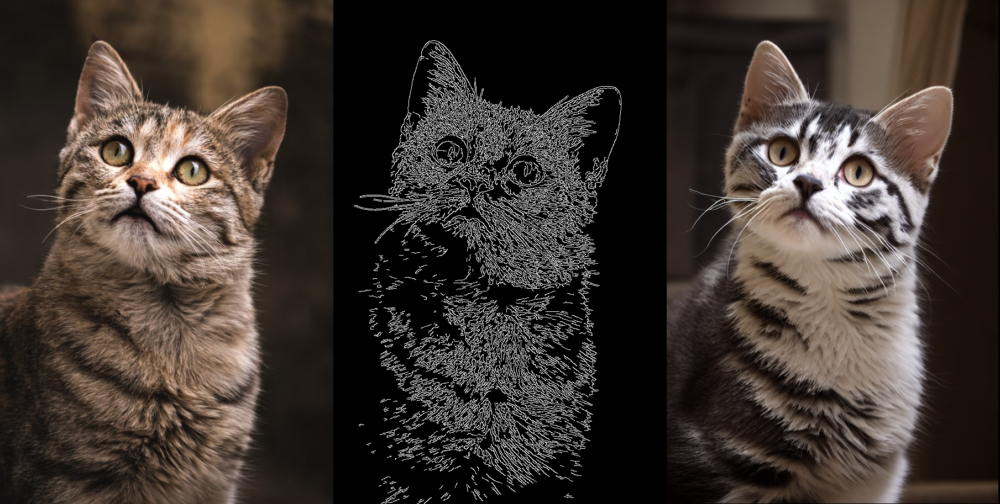

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11p_sd15_canny"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/cat.jpg"
    image, control_image = load_data_canny(image_path)

    # HYPERPARAMETERS
    prompt = "a black white cat in the home"
    negative_prompt = "ugly, low quality, bad anatomy, multiple head, signature, watermark"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **2) ControlNet conditioned on `Depth`**

We can estimate depths of objects in an image using depth estimation models. You can see the depth of the cat below.

In [ ]:
def load_data_depth(image_path):
    init_image = Image.open(image_path).convert("RGB")

    depth_estimator = pipeline(task='depth-estimation') # pipeline from transformers library

    image = depth_estimator(init_image)['depth']
    image = np.array(image)
    image = image[:, :, None]
    image = np.concatenate([image, image, image], axis=2)
    control_image = Image.fromarray(image)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/942 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.37G [00:00<?, ?B/s]

Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


  0%|          | 0/22 [00:00<?, ?it/s]

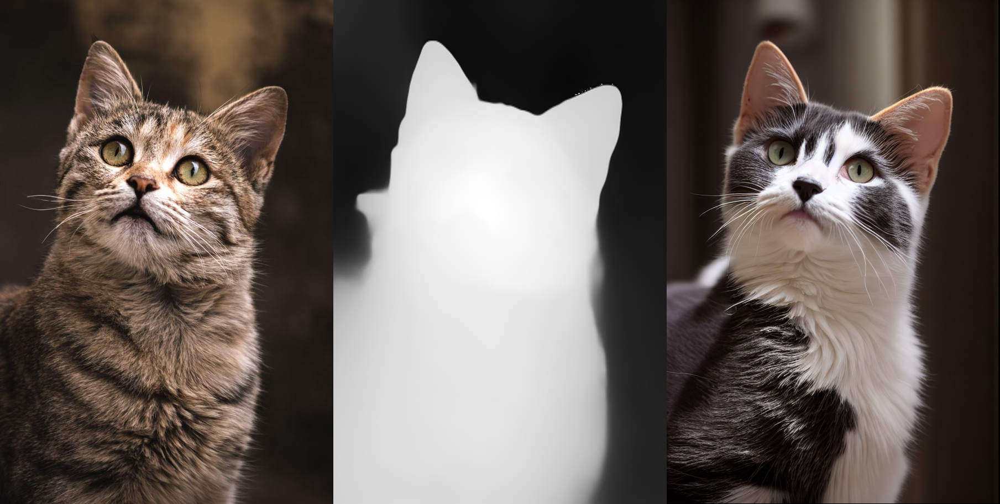

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11f1p_sd15_depth"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/cat.jpg"
    image, control_image = load_data_depth(image_path)

    # HYPERPARAMETERS
    prompt = "a black white cat in the home"
    negative_prompt = "ugly, low quality, bad anatomy, multiple head, signature, watermark"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **3) ControlNet conditioned on `Lineart`**

In [ ]:
def load_data_lineart(image_path):
    init_image = Image.open(image_path).convert("RGB")

    init_image = init_image.resize((512, 768))

    processor = LineartDetector.from_pretrained("lllyasviel/Annotators")
    control_image = processor(init_image)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/22 [00:00<?, ?it/s]

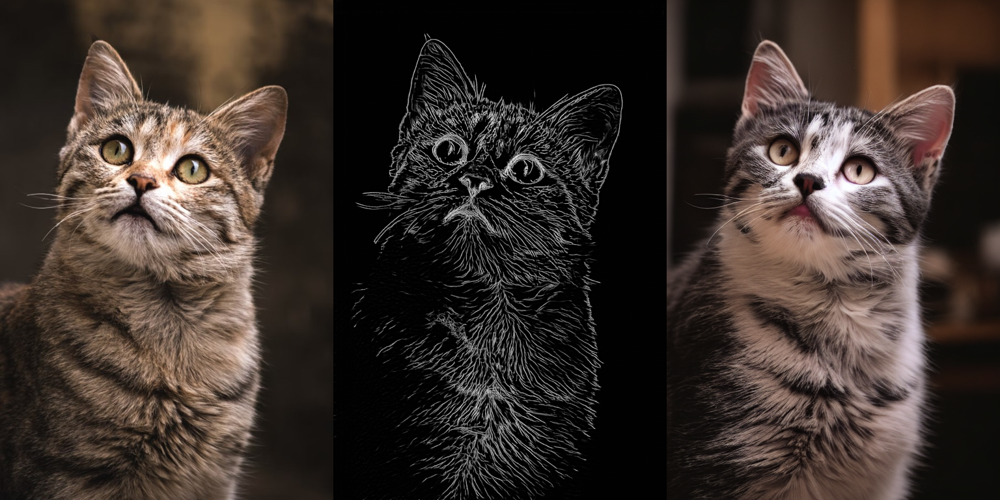

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "ControlNet-1-1-preview/control_v11p_sd15_lineart"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/cat.jpg"
    image, control_image = load_data_lineart(image_path)

    # HYPERPARAMETERS
    prompt = "a black white cat in the home"
    negative_prompt = "ugly, low quality, bad anatomy, multiple head, signature, watermark"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **4) ControlNet conditioned on `Scribble`**

In [ ]:
def load_data_scribble(image_path):
    init_image = Image.open(image_path).convert("RGB")

    init_image = init_image.resize((512, 512))

    processor = HEDdetector.from_pretrained('lllyasviel/Annotators')
    control_image = processor(init_image, scribble=True)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/22 [00:00<?, ?it/s]

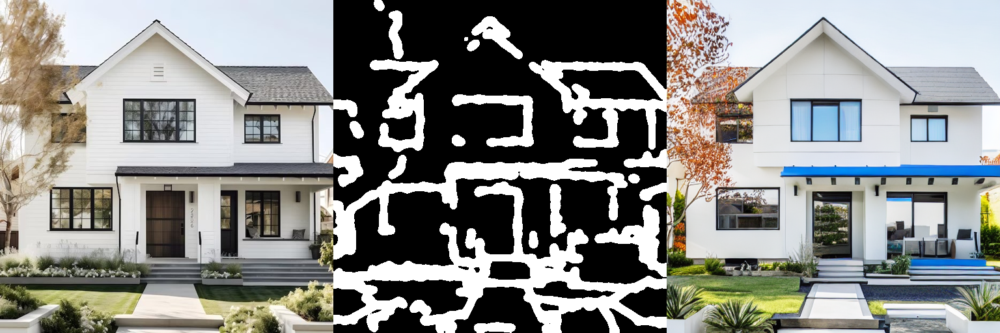

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11p_sd15_scribble"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/home.jpg"
    image, control_image = load_data_scribble(image_path)

    # HYPERPARAMETERS
    prompt = "a blue modern house"
    negative_prompt = "bad quality"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **5) ControlNet conditioned on `Softedge`**

In [ ]:
def load_data_softedge(image_path):
    init_image = Image.open(image_path).convert("RGB")

    init_image = init_image.resize((512, 512))

    processor = PidiNetDetector.from_pretrained('lllyasviel/Annotators')
    control_image = processor(init_image, safe=True)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


table5_pidinet.pth:   0%|          | 0.00/2.87M [00:00<?, ?B/s]

  0%|          | 0/22 [00:00<?, ?it/s]

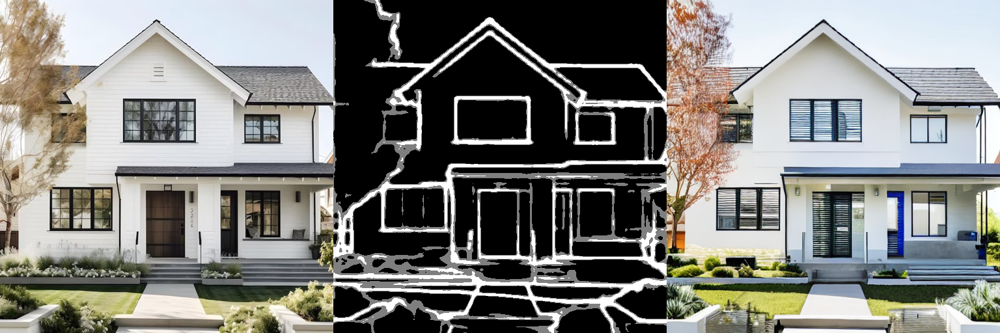

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11p_sd15_softedge"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/home.jpg"
    image, control_image = load_data_softedge(image_path)

    # HYPERPARAMETERS
    prompt = "a blue modern house"
    negative_prompt = "low quality"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **6) ControlNet conditioned on `Normalbae`**

In [ ]:
def load_data_normalbae(image_path):
    init_image = Image.open(image_path).convert("RGB")

    init_image = init_image.resize((512, 512))

    processor = NormalBaeDetector.from_pretrained("lllyasviel/Annotators")
    control_image = processor(init_image)

    return init_image, control_image

config.json:   0%|          | 0.00/1.00k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


scannet.pt:   0%|          | 0.00/291M [00:00<?, ?B/s]

Loading base model ()...Done.
Removing last two layers (global_pool & classifier).


  0%|          | 0/22 [00:00<?, ?it/s]

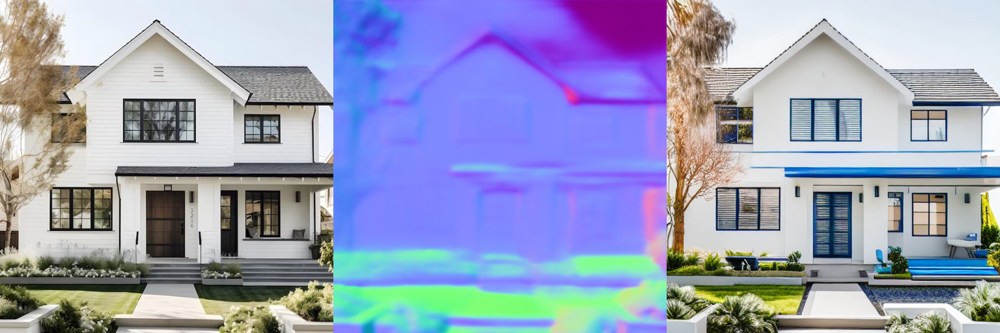

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11p_sd15_normalbae"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/home.jpg"
    image, control_image = load_data_normalbae(image_path)

    # HYPERPARAMETERS
    prompt = "a blue modern house"
    negative_prompt = "low quality"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **7) ControlNet conditioned on `Mlsd`**

In [ ]:
def load_data_mlsd(image_path):
    init_image = Image.open(image_path).convert("RGB")

    init_image = init_image.resize((512, 512))
    processor = MLSDdetector.from_pretrained('lllyasviel/ControlNet')
    control_image = processor(init_image)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/22 [00:00<?, ?it/s]

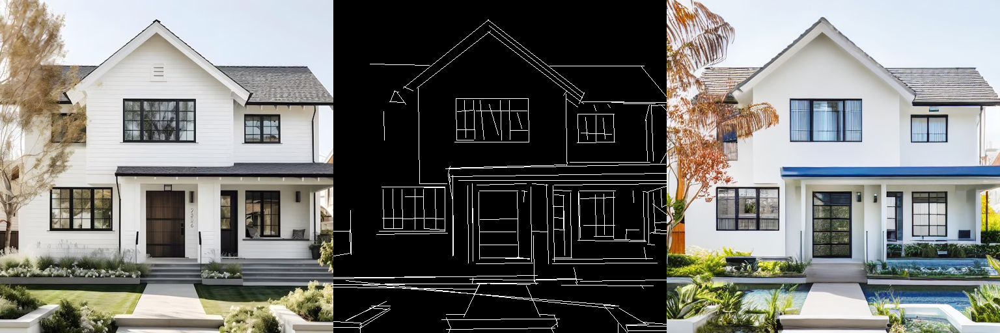

In [ ]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11p_sd15_mlsd"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/home.jpg"
    image, control_image = load_data_mlsd(image_path)

    # HYPERPARAMETERS
    prompt = "a blue modern house"
    negative_prompt = "low quality"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **8) ControlNet conditioned on `LineartAnime`**

In [17]:
def load_data_anime(image_path):
    init_image = Image.open(image_path).convert("RGB")

    init_image = init_image.resize((512, 640))

    processor = LineartAnimeDetector.from_pretrained("lllyasviel/Annotators")
    control_image = processor(init_image)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/22 [00:00<?, ?it/s]

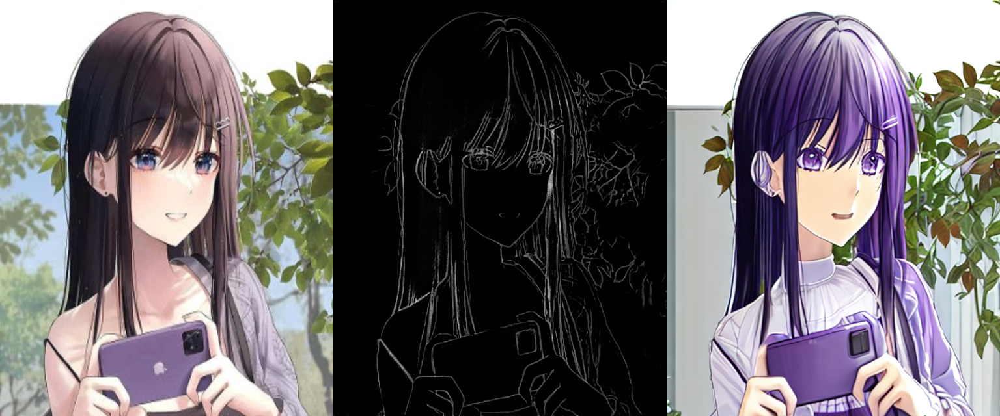

In [18]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/control_v11p_sd15s2_lineart_anime"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/anime.jpg"
    image, control_image = load_data_anime(image_path)

    # HYPERPARAMETERS
    prompt = "A cute anime girl, white hair with highlighted purple"
    negative_prompt = "ugly, low quality"
    seed = 33
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 7.5
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()

### **9) ControlNet conditioned on `Segmentation`**

In [19]:
# Color palette for segmented areas

palette = np.asarray([
    [0, 0, 0],
    [120, 120, 120],
    [180, 120, 120],
    [6, 230, 230],
    [80, 50, 50],
    [4, 200, 3],
    [120, 120, 80],
    [140, 140, 140],
    [204, 5, 255],
    [230, 230, 230],
    [4, 250, 7],
    [224, 5, 255],
    [235, 255, 7],
    [150, 5, 61],
    [120, 120, 70],
    [8, 255, 51],
    [255, 6, 82],
    [143, 255, 140],
    [204, 255, 4],
    [255, 51, 7],
    [204, 70, 3],
    [0, 102, 200],
    [61, 230, 250],
    [255, 6, 51],
    [11, 102, 255],
    [255, 7, 71],
    [255, 9, 224],
    [9, 7, 230],
    [220, 220, 220],
    [255, 9, 92],
    [112, 9, 255],
    [8, 255, 214],
    [7, 255, 224],
    [255, 184, 6],
    [10, 255, 71],
    [255, 41, 10],
    [7, 255, 255],
    [224, 255, 8],
    [102, 8, 255],
    [255, 61, 6],
    [255, 194, 7],
    [255, 122, 8],
    [0, 255, 20],
    [255, 8, 41],
    [255, 5, 153],
    [6, 51, 255],
    [235, 12, 255],
    [160, 150, 20],
    [0, 163, 255],
    [140, 140, 140],
    [250, 10, 15],
    [20, 255, 0],
    [31, 255, 0],
    [255, 31, 0],
    [255, 224, 0],
    [153, 255, 0],
    [0, 0, 255],
    [255, 71, 0],
    [0, 235, 255],
    [0, 173, 255],
    [31, 0, 255],
    [11, 200, 200],
    [255, 82, 0],
    [0, 255, 245],
    [0, 61, 255],
    [0, 255, 112],
    [0, 255, 133],
    [255, 0, 0],
    [255, 163, 0],
    [255, 102, 0],
    [194, 255, 0],
    [0, 143, 255],
    [51, 255, 0],
    [0, 82, 255],
    [0, 255, 41],
    [0, 255, 173],
    [10, 0, 255],
    [173, 255, 0],
    [0, 255, 153],
    [255, 92, 0],
    [255, 0, 255],
    [255, 0, 245],
    [255, 0, 102],
    [255, 173, 0],
    [255, 0, 20],
    [255, 184, 184],
    [0, 31, 255],
    [0, 255, 61],
    [0, 71, 255],
    [255, 0, 204],
    [0, 255, 194],
    [0, 255, 82],
    [0, 10, 255],
    [0, 112, 255],
    [51, 0, 255],
    [0, 194, 255],
    [0, 122, 255],
    [0, 255, 163],
    [255, 153, 0],
    [0, 255, 10],
    [255, 112, 0],
    [143, 255, 0],
    [82, 0, 255],
    [163, 255, 0],
    [255, 235, 0],
    [8, 184, 170],
    [133, 0, 255],
    [0, 255, 92],
    [184, 0, 255],
    [255, 0, 31],
    [0, 184, 255],
    [0, 214, 255],
    [255, 0, 112],
    [92, 255, 0],
    [0, 224, 255],
    [112, 224, 255],
    [70, 184, 160],
    [163, 0, 255],
    [153, 0, 255],
    [71, 255, 0],
    [255, 0, 163],
    [255, 204, 0],
    [255, 0, 143],
    [0, 255, 235],
    [133, 255, 0],
    [255, 0, 235],
    [245, 0, 255],
    [255, 0, 122],
    [255, 245, 0],
    [10, 190, 212],
    [214, 255, 0],
    [0, 204, 255],
    [20, 0, 255],
    [255, 255, 0],
    [0, 153, 255],
    [0, 41, 255],
    [0, 255, 204],
    [41, 0, 255],
    [41, 255, 0],
    [173, 0, 255],
    [0, 245, 255],
    [71, 0, 255],
    [122, 0, 255],
    [0, 255, 184],
    [0, 92, 255],
    [184, 255, 0],
    [0, 133, 255],
    [255, 214, 0],
    [25, 194, 194],
    [102, 255, 0],
    [92, 0, 255],
])

In [20]:
def load_data_segmentation(image_path):

    image_processor = AutoImageProcessor.from_pretrained("openmmlab/upernet-convnext-small")
    image_segmentor = UperNetForSemanticSegmentation.from_pretrained("openmmlab/upernet-convnext-small")

    init_image = Image.open(image_path).convert("RGB")

    pixel_values = image_processor(init_image, return_tensors="pt").pixel_values

    with torch.no_grad():
      outputs = image_segmentor(pixel_values)

    seg = image_processor.post_process_semantic_segmentation(outputs, target_sizes=[init_image.size[::-1]])[0]

    color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3

    for label, color in enumerate(palette):
        color_seg[seg == label, :] = color

    color_seg = color_seg.astype(np.uint8)

    control_image = Image.fromarray(color_seg)

    return init_image, control_image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/22 [00:00<?, ?it/s]

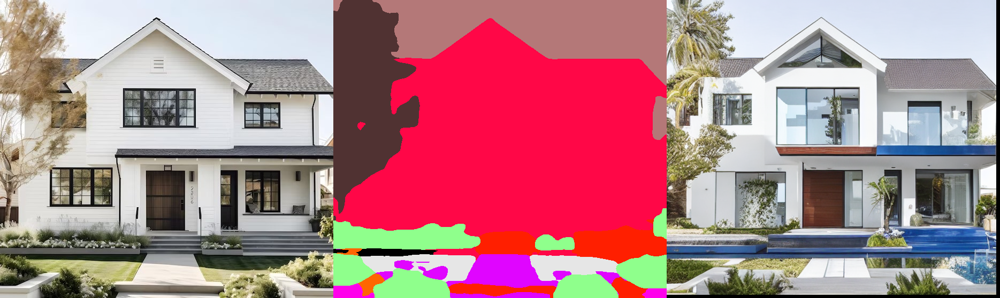

In [22]:
def main():
    # MODEL DOWNLOAD
    checkpoint = "lllyasviel/sd-controlnet-seg"
    model_name = "runwayml/stable-diffusion-v1-5"
    scheduler_name = UniPCMultistepScheduler

    pipe = load_model(checkpoint=checkpoint, model_name=model_name, scheduler_name=scheduler_name)

    # IMAGE DOWNLOAD
    image_path = "/content/home.jpg"
    image, control_image = load_data_segmentation(image_path)

    # HYPERPARAMETERS
    prompt = "A blue modern house"
    negative_prompt = "low quality"
    seed = 12345567
    num_inference_steps = 30
    strength = 0.75
    guidance_scale = 8.0
    controlnet_conditioning_scale = 0.9

    output_image = generate_image(pipe=pipe,
                                  prompt=prompt,
                                  negative_prompt=negative_prompt,
                                  image=image,
                                  control_image=control_image,
                                  seed=seed,
                                  num_inference_steps=num_inference_steps,
                                  strength=strength,
                                  guidance_scale=guidance_scale,
                                  controlnet_conditioning_scale=controlnet_conditioning_scale)

    return image_grid([image, control_image, output_image], 1, 3)


main()